# Import & config

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
os.chdir('C:\\Users\\Usuario\\TFG\\digipanca\\')

In [3]:
import torch
from src.training.setup.transforms_factory import get_transforms

# __PancreasDataset2D__

In [4]:
from src.data.dataset2d import PancreasDataset2D

In [5]:
ds_2d = PancreasDataset2D(
    data_dir='data/processed/2d_res/train',
    patient_ids=['rtum1']
)

📊 Loading dataset... 92 slices found.


In [6]:
image2d, mask2d, _ = ds_2d[40]
print(f"Image 2D shape: {image2d.shape}")
print(f"Mask 2D shape: {mask2d.shape}")

Image 2D shape: torch.Size([1, 256, 256])
Mask 2D shape: torch.Size([256, 256])


In [7]:
volume2d, masks2d = ds_2d.get_patient_volume(patient_id='rtum1')
print(f"Volume 2D shape: {volume2d.shape}")
print(f"Masks 2D shape: {masks2d.shape}")

Volume 2D shape: torch.Size([1, 1, 92, 256, 256])
Masks 2D shape: torch.Size([1, 92, 256, 256])


# __PancreasDataset3D__

In [8]:
from src.data.dataset3d import PancreasDataset3D

In [41]:
ds_3d = PancreasDataset3D(
    data_dir='data/processed/3d_res/train',
    patient_ids=['rtum1']
)

📊 Loading dataset... 77 sub-volumes found.


In [42]:
image3d, mask3d, _ = ds_3d[0]
print(f"Image 3D shape: {image3d.shape}, type: {image3d.dtype}")
print(f"Mask 3D shape: {mask3d.shape}, type: {mask3d.dtype}")

Image 3D shape: torch.Size([1, 16, 256, 256]), type: torch.float32
Mask 3D shape: torch.Size([16, 256, 256]), type: torch.int64


In [12]:
from src.models.unet3d import UNet3D

In [13]:
unet3d = UNet3D(in_channels=1, out_channels=5)
unet3d.eval()

pred_3d = unet3d(image3d.unsqueeze(0).float())
print(pred_3d.shape)

torch.Size([1, 5, 16, 256, 256])


In [14]:
from src.metrics.sma import convert_to_one_hot

In [15]:
y_pred_3doh, y_true_3doh = convert_to_one_hot(pred_3d, mask3d.unsqueeze(0))
print(f"pred 3d oh: {y_pred_3doh.shape}")
print(f"true 3d oh: {y_true_3doh.shape}")

pred 3d oh: torch.Size([1, 5, 16, 256, 256])
true 3d oh: torch.Size([1, 5, 16, 256, 256])


In [16]:
perfect_pred = y_true_3doh.clone()

In [17]:
from src.metrics.sma import SegmentationMetricsAccumulator as SMAccum

In [18]:
smignore = SMAccum(include_background=False)

In [19]:
smignore.update(perfect_pred, y_true_3doh)

{'dice_class_1': nan,
 'dice_class_2': nan,
 'dice_class_3': 1.0,
 'dice_class_4': 1.0,
 'iou_class_1': nan,
 'iou_class_2': nan,
 'iou_class_3': 1.0,
 'iou_class_4': 1.0,
 'precision_class_1': nan,
 'precision_class_2': nan,
 'precision_class_3': 1.0,
 'precision_class_4': 1.0,
 'recall_class_1': nan,
 'recall_class_2': nan,
 'recall_class_3': 1.0,
 'recall_class_4': 1.0,
 'dice': 1.0,
 'iou': 1.0,
 'precision': 1.0,
 'recall': 1.0}

## __Check sub-volumes__

In [20]:
def check_subvol_recons():
    dataset = PancreasDataset3D(
        data_dir='data/processed/3d_res/train',
        patient_ids=['rtum1']
    )
    v, m = dataset.get_patient_volume('rtum1')
    print(f"volume shape: {v.shape}")
    print(f"mask shape: {m.shape}")

In [21]:
check_subvol_recons()

📊 Loading dataset... 77 sub-volumes found.
volume shape: torch.Size([1, 1, 92, 256, 256])
mask shape: torch.Size([1, 92, 256, 256])


# __Visualization test__

In [24]:
from src.utils.config import load_config
import matplotlib.pyplot as plt

def visualization_test(patient_id):
    # 2D
    dataset_2d = PancreasDataset2D(
        data_dir='data/processed/2d_res/train',
        patient_ids=[patient_id]
    )
    v2d, m2d = dataset_2d.get_patient_volume(patient_id)
    # 3D
    dataset_3d = PancreasDataset3D(
        data_dir='data/processed/3d_res/train',
        patient_ids=[patient_id]
    )
    v3d, m3d = dataset_3d.get_patient_volume(patient_id)

    depth = v2d.shape[2]
    
    for i in range(0, depth):
        slice_2d = v2d[0, 0, i].cpu().numpy()
        slice_3d = v3d[0, 0, i].cpu().numpy()

        # print(f"Slice {i}: {torch.equal(v2d[0, 0, i], v3d[0, 0, i])}")
        
        fig, axs = plt.subplots(1, 2, figsize=(10, 5))
        axs[0].imshow(slice_2d, cmap='gray')
        axs[0].set_title(f'2D Slice {i}')
        axs[0].axis('off')
        
        axs[1].imshow(slice_3d, cmap='gray')
        axs[1].set_title(f'3D Slice {i}')
        axs[1].axis('off')
        
        plt.tight_layout()
        plt.show()

📊 Loading dataset... 92 slices found.
📊 Loading dataset... 77 sub-volumes found.


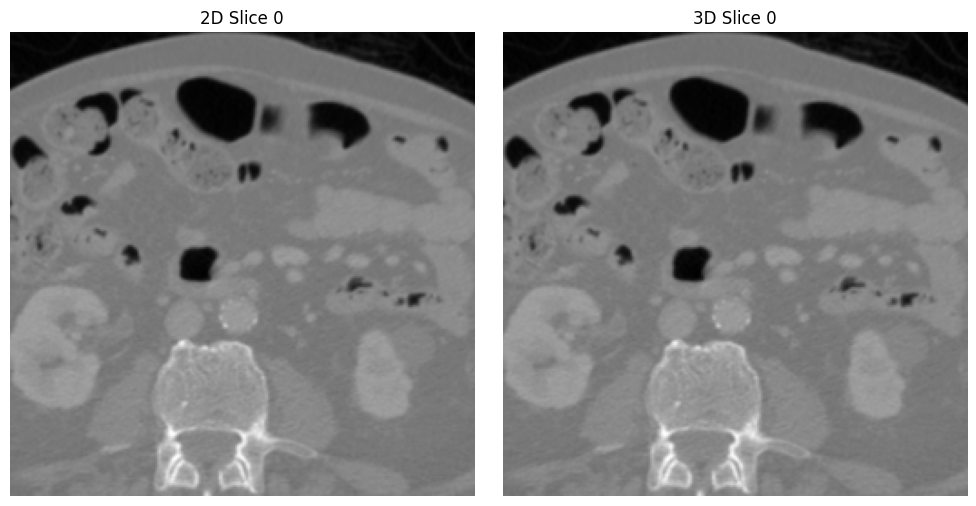

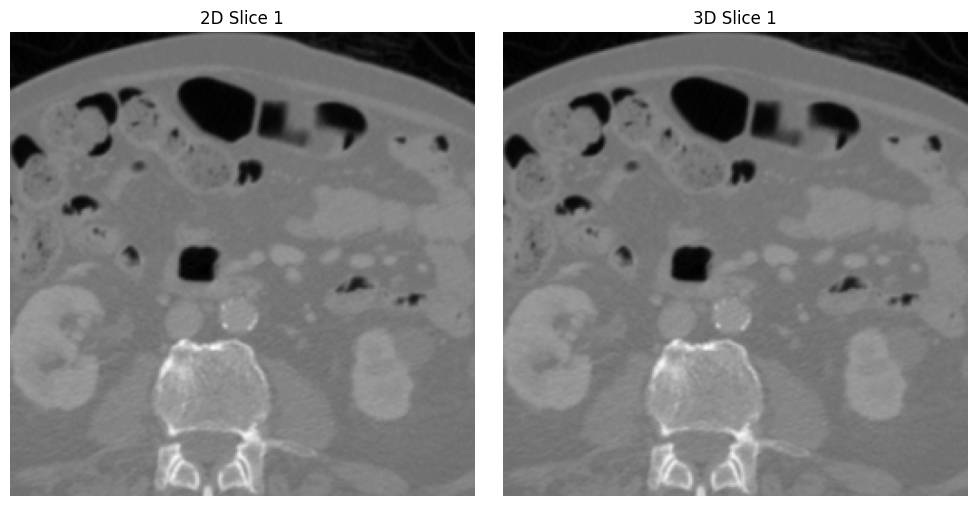

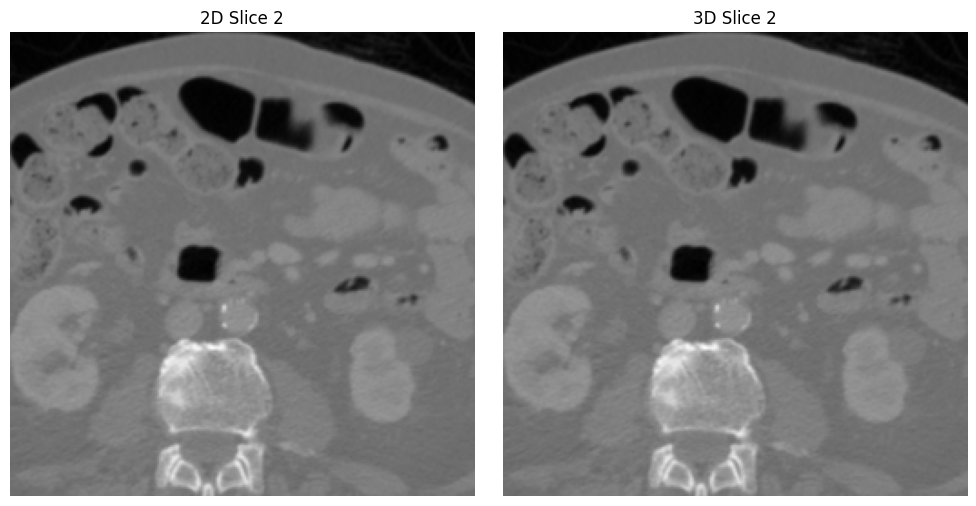

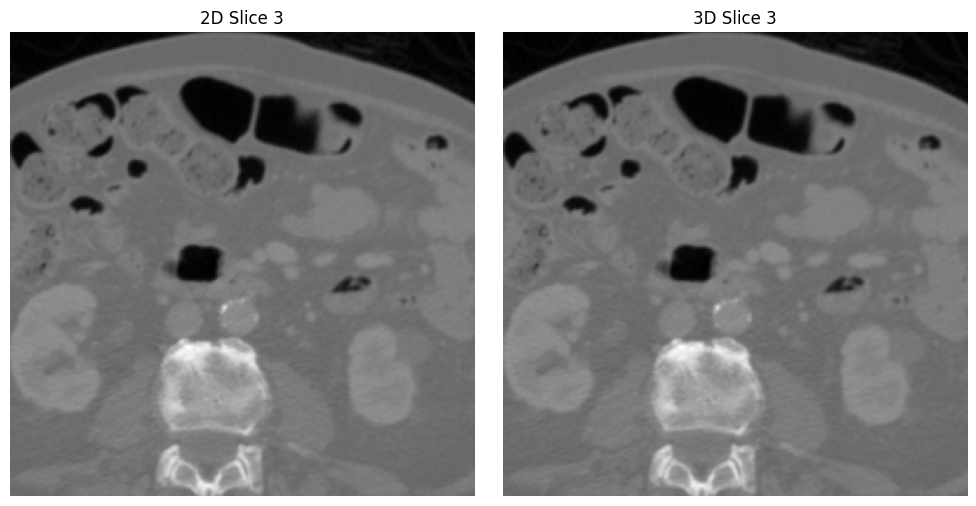

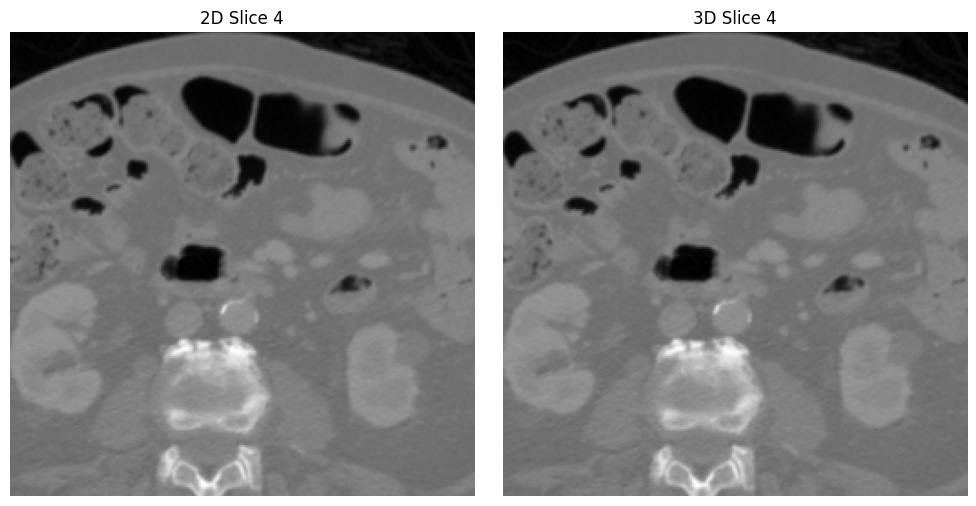

...

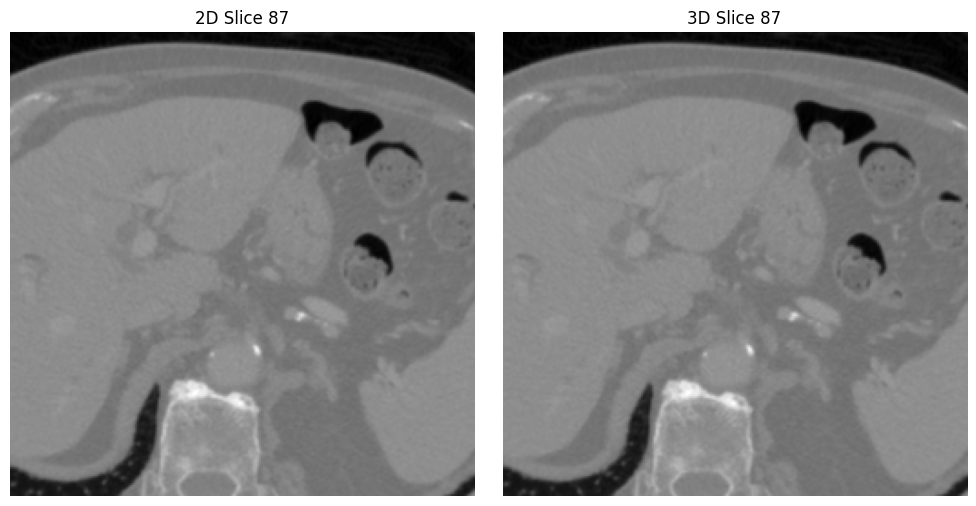

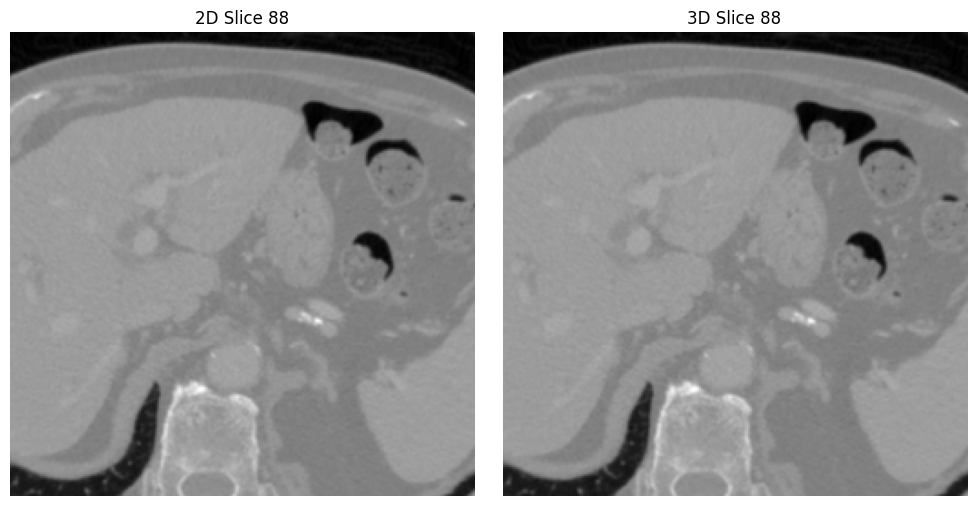

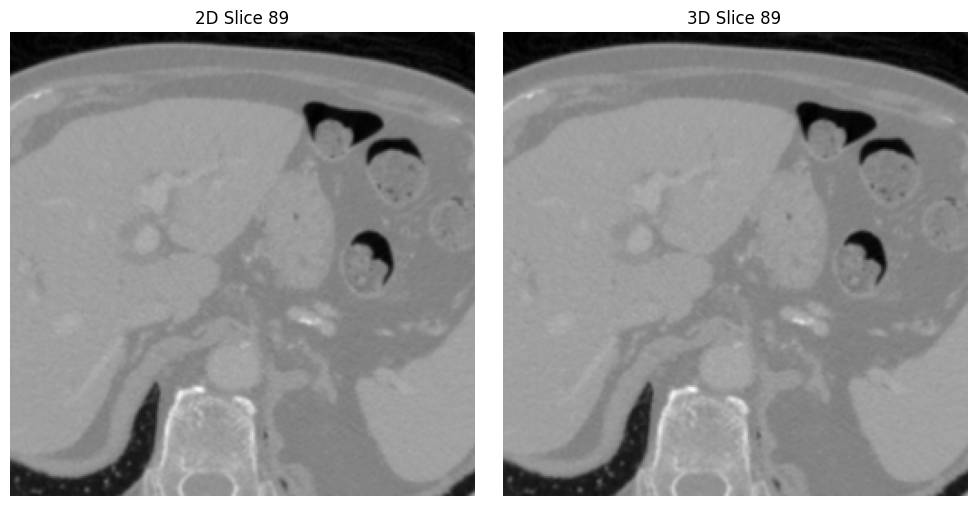

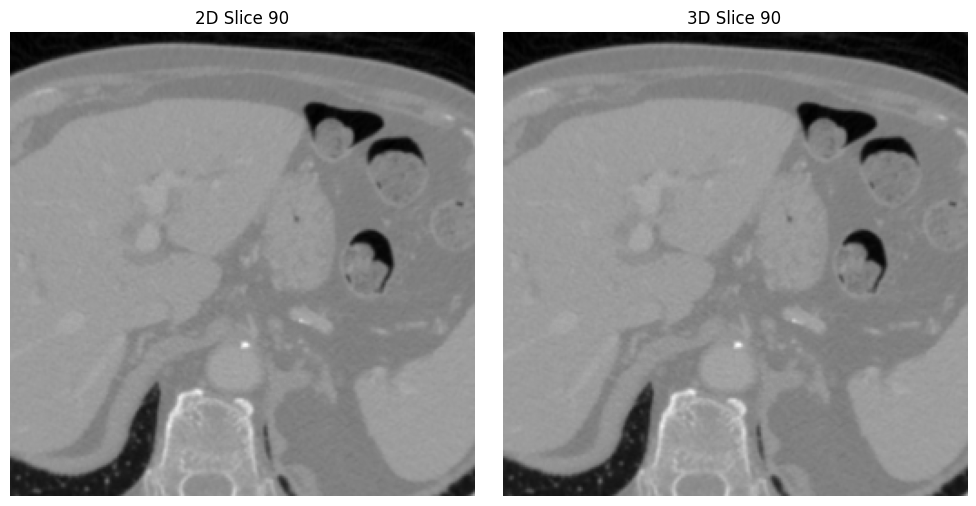

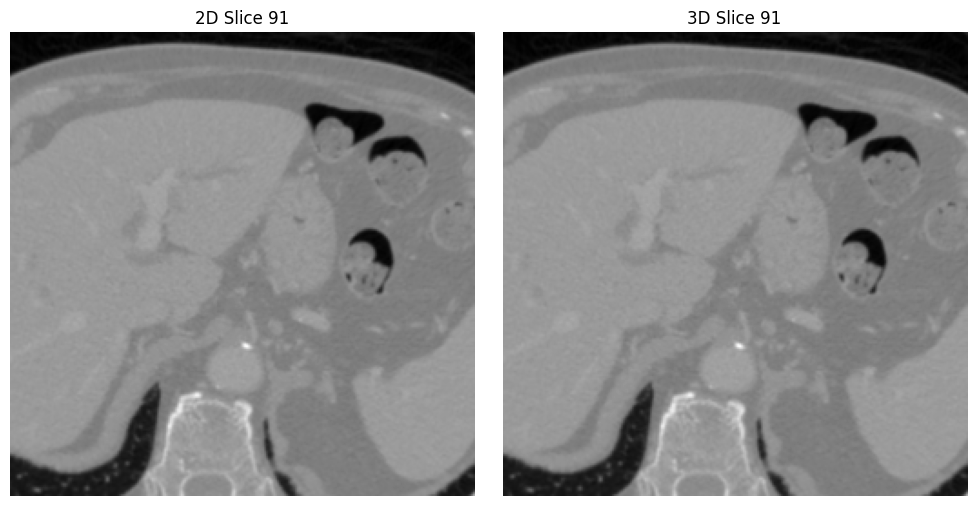

In [25]:
visualization_test('rtum1')

In [29]:
def test_subvolume_slices(patient_id, subvolume):
    dataset_3d = PancreasDataset3D(
        data_dir='data/processed/3d_res/train',
        patient_ids=[patient_id]
    )

    image, mask, _ = dataset_3d[subvolume]
    print(image.shape)
    print(mask.shape)

    for i in range(0, image.shape[1], 2):
        slice_a = image[0, i].cpu().numpy()
        slice_b = image[0, i+1].cpu().numpy()
        
        fig, axs = plt.subplots(1, 2, figsize=(10, 5))
        axs[0].imshow(slice_a, cmap='gray')
        axs[0].set_title(f'Slice {i}')
        axs[0].axis('off')
        
        axs[1].imshow(slice_b, cmap='gray')
        axs[1].set_title(f'Slice {i+1}')
        axs[1].axis('off')
        
        plt.tight_layout()
        plt.show()

['rtum1']
{'image_rtum1_0.npy': {'patient_id': 'rtum1', 'slices': [0, 15], 'mask_filename': 'mask_rtum1_0.npy'}, 'image_rtum1_1.npy': {'patient_id': 'rtum1', 'slices': [1, 16], 'mask_filename': 'mask_rtum1_1.npy'}, 'image_rtum1_2.npy': {'patient_id': 'rtum1', 'slices': [2, 17], 'mask_filename': 'mask_rtum1_2.npy'}, 'image_rtum1_3.npy': {'patient_id': 'rtum1', 'slices': [3, 18], 'mask_filename': 'mask_rtum1_3.npy'}, 'image_rtum1_4.npy': {'patient_id': 'rtum1', 'slices': [4, 19], 'mask_filename': 'mask_rtum1_4.npy'}, 'image_rtum1_5.npy': {'patient_id': 'rtum1', 'slices': [5, 20], 'mask_filename': 'mask_rtum1_5.npy'}, 'image_rtum1_6.npy': {'patient_id': 'rtum1', 'slices': [6, 21], 'mask_filename': 'mask_rtum1_6.npy'}, 'image_rtum1_7.npy': {'patient_id': 'rtum1', 'slices': [7, 22], 'mask_filename': 'mask_rtum1_7.npy'}, 'image_rtum1_8.npy': {'patient_id': 'rtum1', 'slices': [8, 23], 'mask_filename': 'mask_rtum1_8.npy'}, 'image_rtum1_9.npy': {'patient_id': 'rtum1', 'slices': [9, 24], 'mask_f

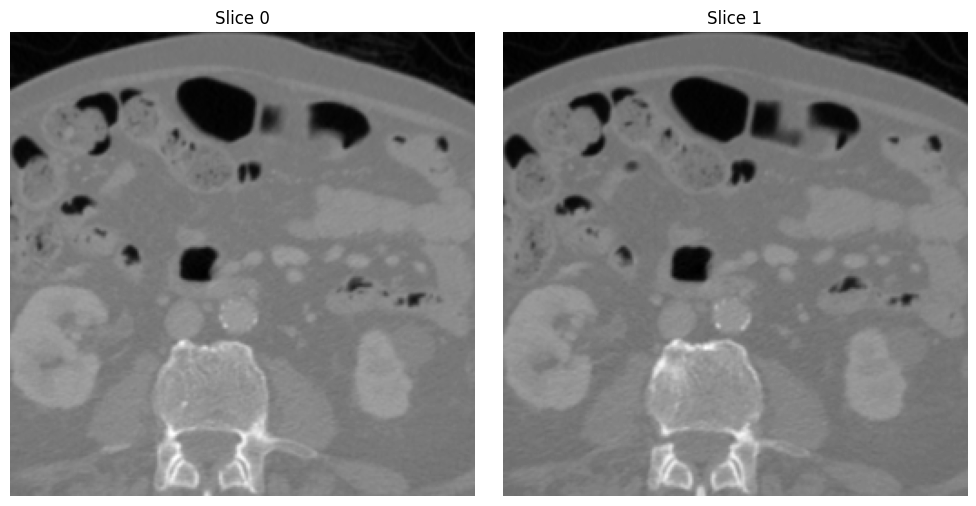

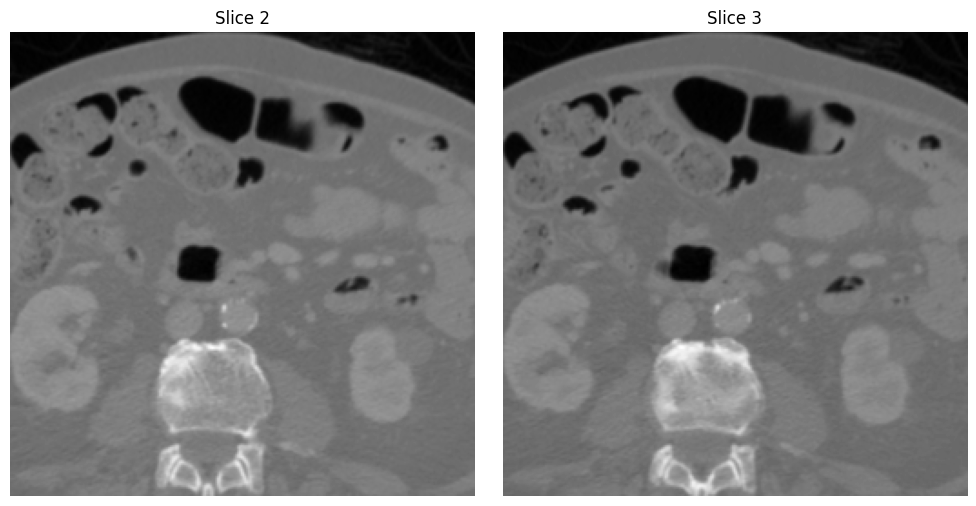

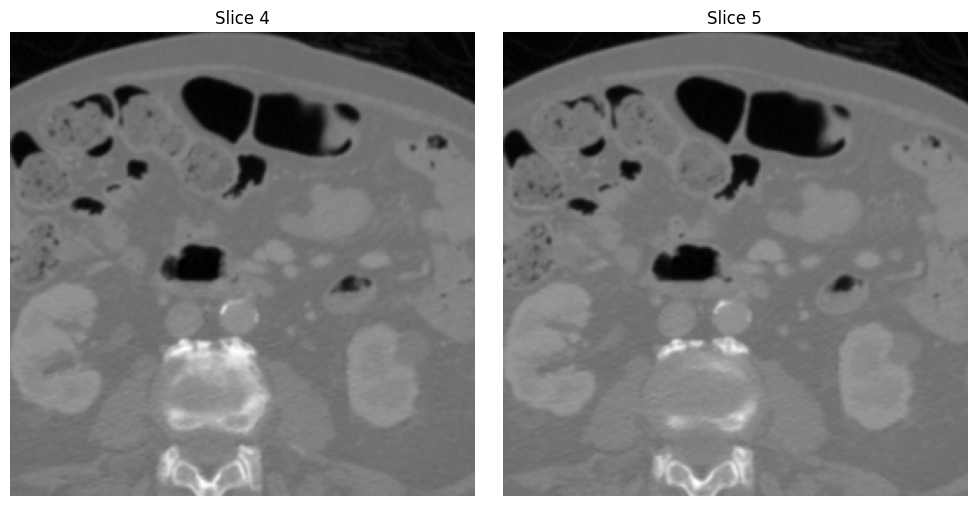

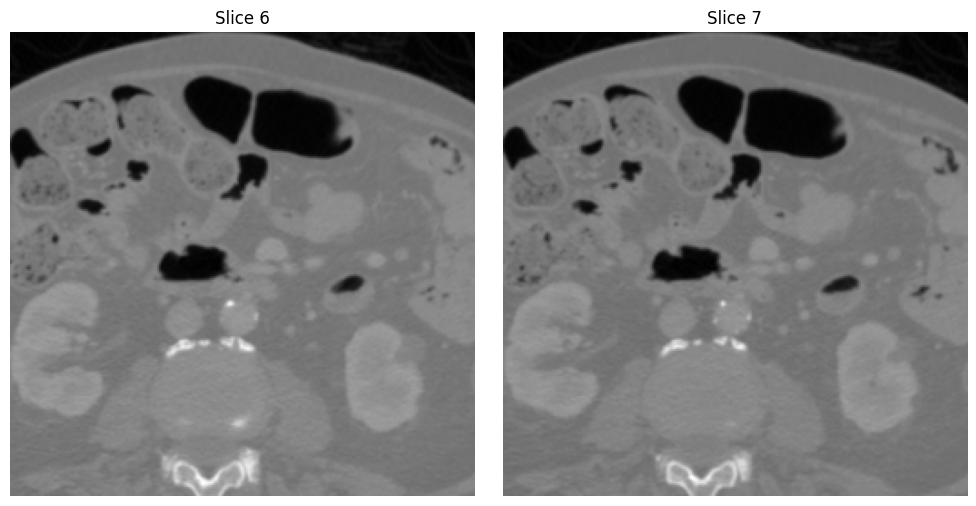

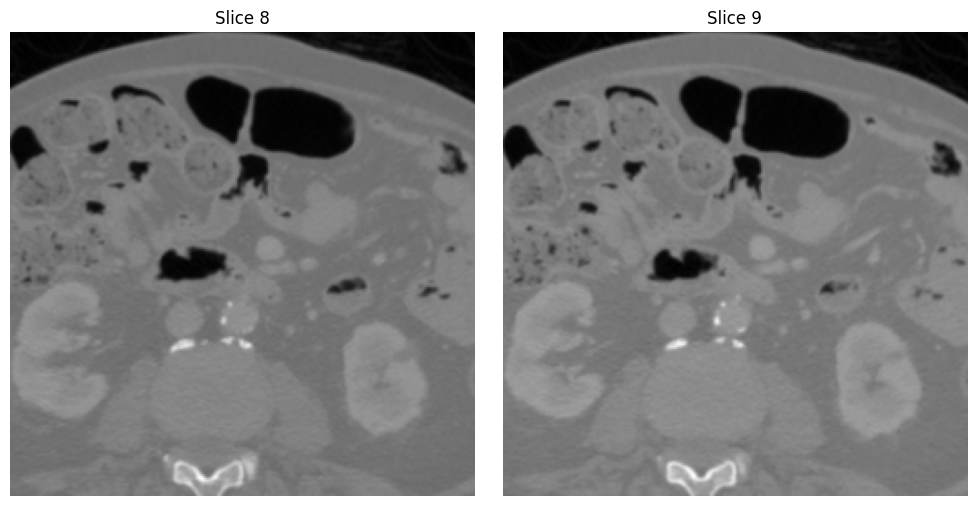

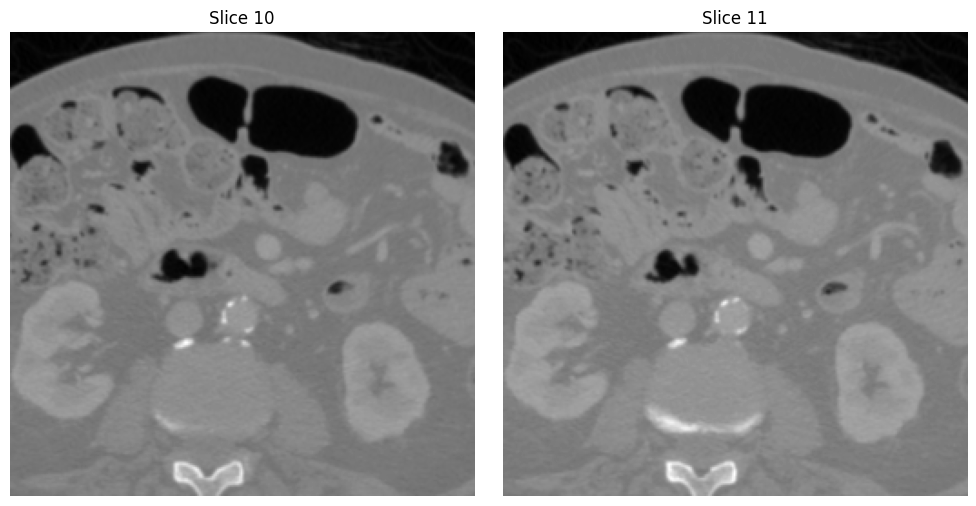

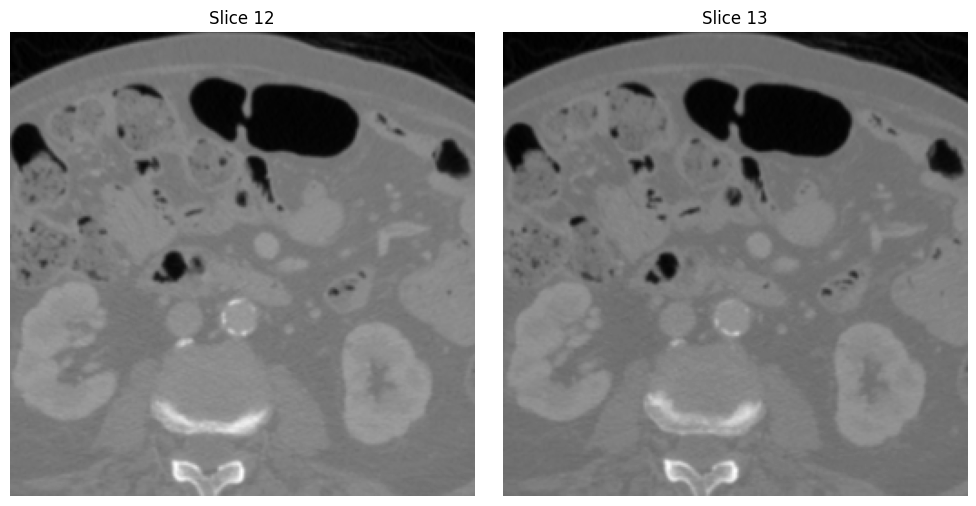

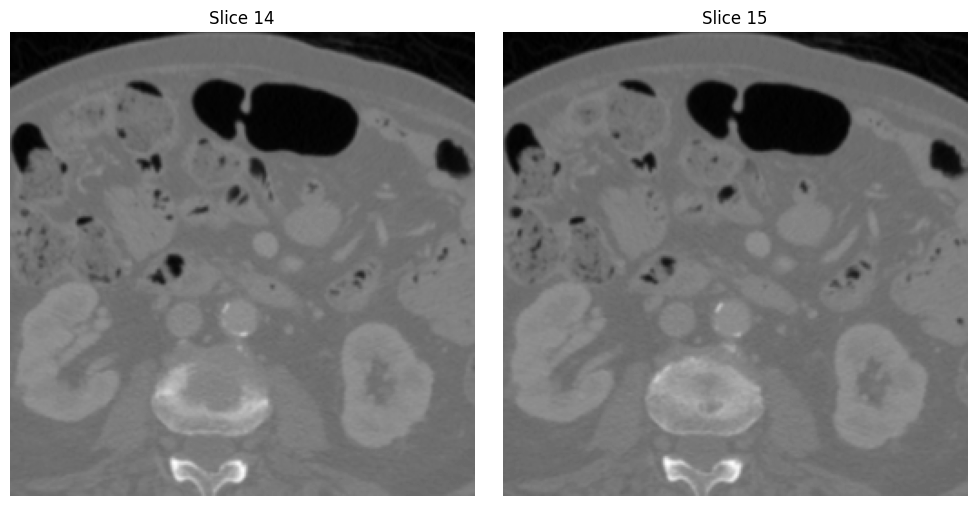

In [30]:
test_subvolume_slices('rtum1', 0)

📊 Loading dataset... 77 sub-volumes found.
torch.Size([1, 16, 256, 256])
torch.Size([16, 256, 256])


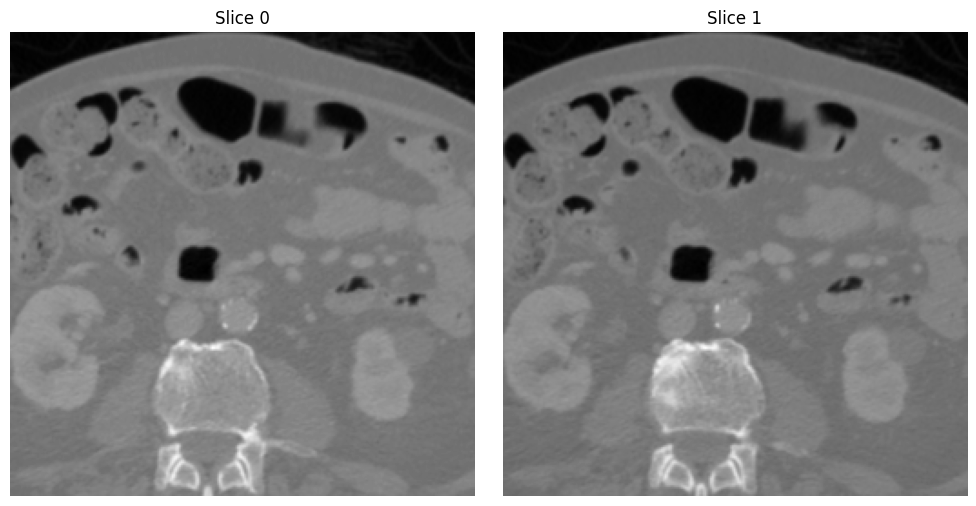

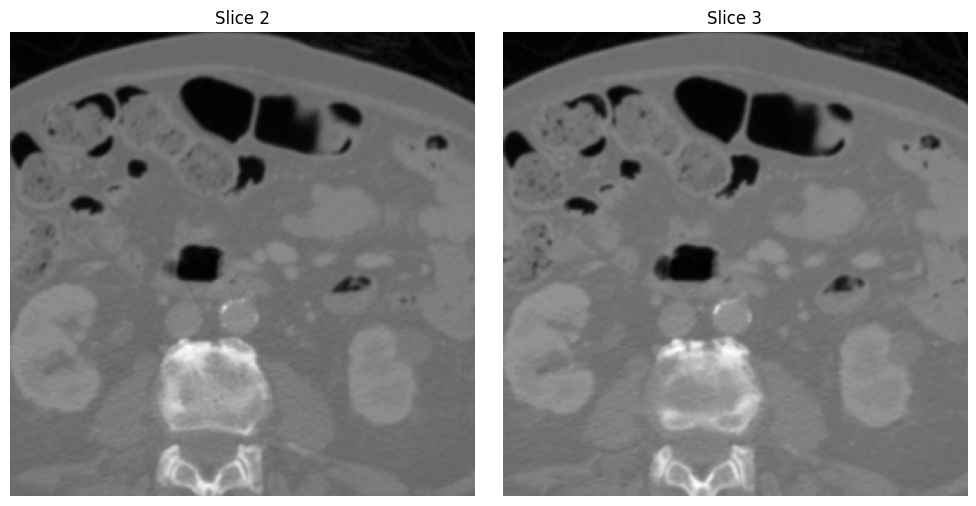

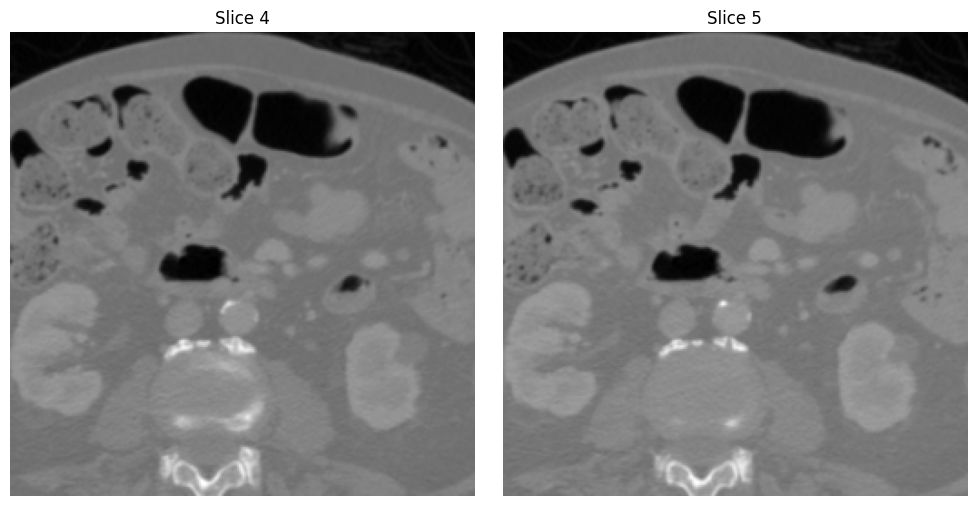

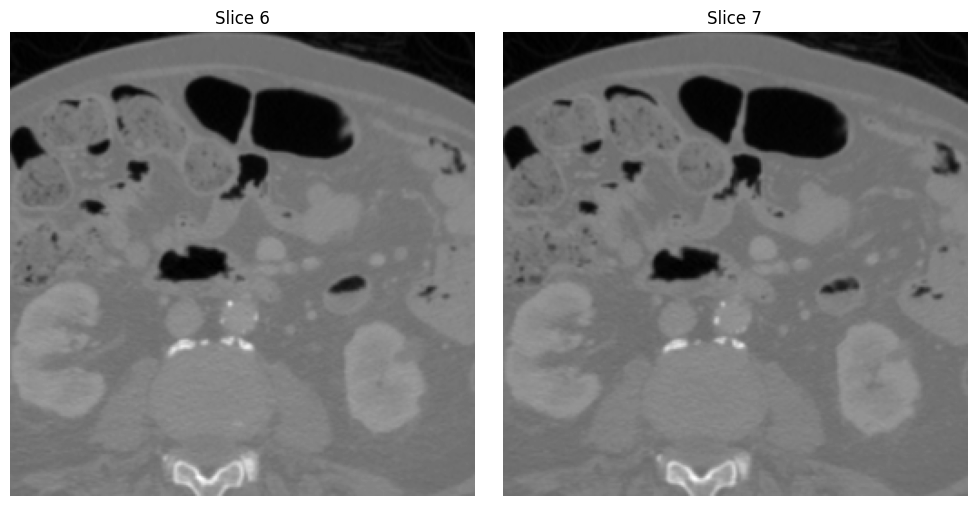

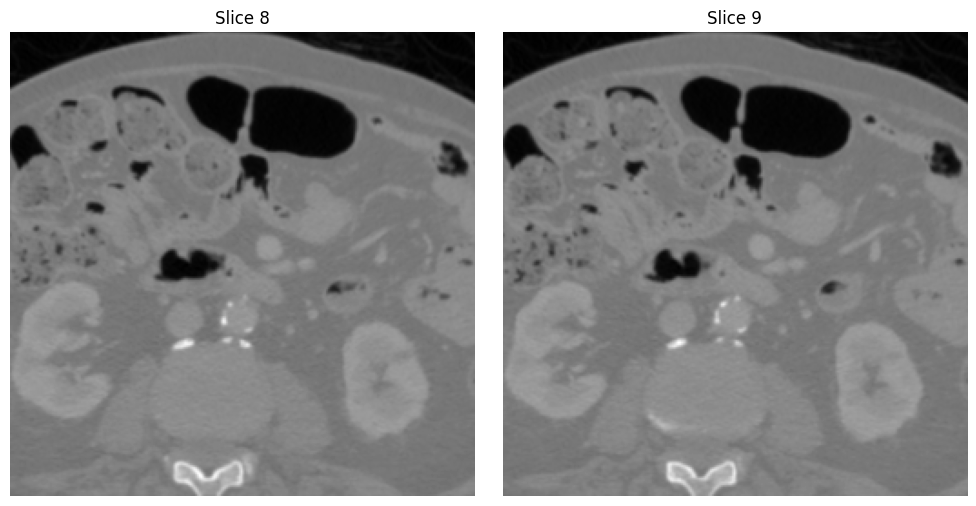

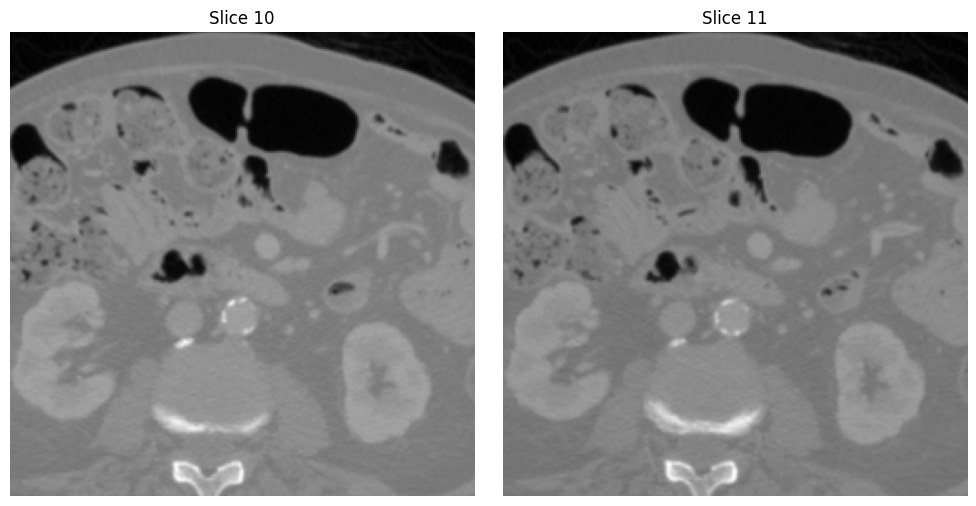

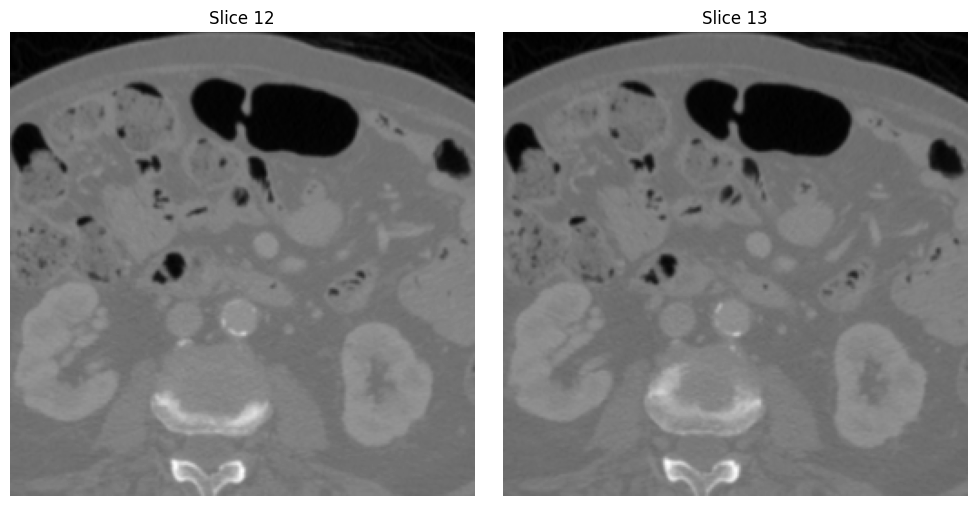

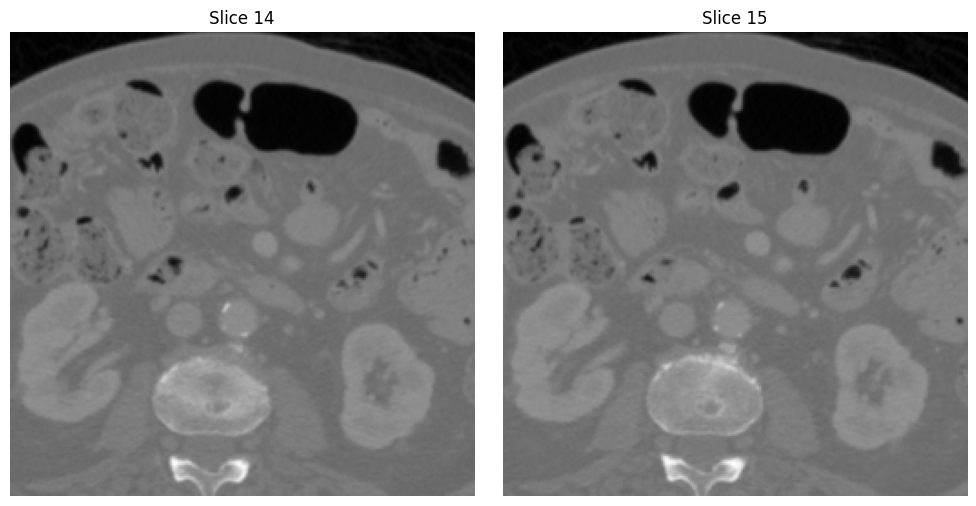

In [28]:
test_subvolume_slices('rtum1', 1)

# __Equality test: transforms (images are already cropped)__

## Functions

In [32]:
def test_volumes_eq_tf(patient_id, transform_2d, transform_3d):
    # 2D
    dataset_2d = PancreasDataset2D(
        data_dir='data/processed/2d_res/train',
        patient_ids=[patient_id],
        transform=transform_2d
    )
    v2d, m2d = dataset_2d.get_patient_volume(patient_id)
    # 3D
    dataset_3d = PancreasDataset3D(
        data_dir='data/processed/3d_res/train',
        patient_ids=[patient_id],
        transform=transform_3d
    )
    v3d, m3d = dataset_3d.get_patient_volume(patient_id)

    print("TEST")
    print('-'*65)

    print("2D shapes:")
    print(f"\tvol: {v2d.shape}")
    print(f"\tmask: {m2d.shape}")
    print("3D shapes:")
    print(f"\tvol: {v3d.shape}")
    print(f"\tmask: {m3d.shape}")

    print('-'*65)
    print("volume equality")
    print(f"\t2D == 3D: {(torch.equal(v2d, v3d))}")
    print("mask equality")
    print(f"\t2D == 3D: {(torch.equal(m2d, m3d))}")

    cont_vol=0
    cont_msk=0
    for i in range(v2d.shape[2]):
        eq_vol = torch.equal(v2d[:, :, i, ...], v3d[:, :, i, ...])
        eq_msk = torch.equal(m2d[:, :, i, ...], m3d[:, :, i, ...])
        print(f"slice {i} || vol: {eq_vol} | msk: {eq_msk}")
        if not eq_vol:
            cont_vol += 1
        if not eq_msk:
            cont_msk += 1
        
    print(f"\ntotal diffs")
    print(f"\tvol: {cont_vol}")
    print(f"\tmsk: {cont_msk}")

    print(f"m2d dtype: {m2d.dtype}, m3d dtype: {m3d.dtype}")
    print(f"m2d device: {m2d.device}, m3d device: {m3d.device}")
    print(f"max diff: {(m2d - m3d).abs().max()}")
    print(f"v2d dtype: {v2d.dtype}, v3d dtype: {v3d.dtype}")
    print(f"v2d device: {v2d.device}, v3d device: {v3d.device}")
    print(f"max diff: {(v2d - v3d).abs().max()}")

## Test

In [33]:
config_2d = load_config('configs/experiments/deep_aug_9.yaml')
transform_2d = get_transforms(config_2d)
config_3d = load_config('configs/experiments/unet3d_5.yaml')
transform_3d = get_transforms(config_3d)

In [34]:
test_volumes_eq_tf('rtum1', transform_2d, transform_3d)

📊 Loading dataset... 92 slices found.
📊 Loading dataset... 77 sub-volumes found.
TEST
-----------------------------------------------------------------
2D shapes:
	vol: torch.Size([1, 1, 92, 256, 256])
	mask: torch.Size([1, 92, 256, 256])
3D shapes:
	vol: torch.Size([1, 1, 92, 256, 256])
	mask: torch.Size([1, 92, 256, 256])
-----------------------------------------------------------------
volume equality
	2D == 3D: True
mask equality
	2D == 3D: True
slice 0 || vol: True | msk: True
slice 1 || vol: True | msk: True
slice 2 || vol: True | msk: True
slice 3 || vol: True | msk: True
slice 4 || vol: True | msk: True
slice 5 || vol: True | msk: True
slice 6 || vol: True | msk: True
slice 7 || vol: True | msk: True
slice 8 || vol: True | msk: True
slice 9 || vol: True | msk: True
slice 10 || vol: True | msk: True
slice 11 || vol: True | msk: True
slice 12 || vol: True | msk: True
slice 13 || vol: True | msk: True
slice 14 || vol: True | msk: True
slice 15 || vol: True | msk: True
slice 16 || 

In [141]:
from src.training.setup.dataset_factory import get_dataset
td = get_dataset(
    config=config_2d
)

📊 Loading dataset... 8834 slices found.


In [142]:
subset = td.get_patient_subset(patient_id='rtum1')

📊 Loading dataset... 91 slices found.


In [149]:
from src.utils.data import get_patients_in_processed_folder
def test_subset_iter():
    # Get patient IDs
    data_dir = 'data/processed/2d/train'
    patient_ids = get_patients_in_processed_folder(data_dir)

    # Get the transforms
    # transform = get_transforms(config.get('transforms', None))

    # Get the dataset using all data in test/ folder
    test_dataset = get_dataset(
        config=config,
        split_data=None,
        split_type='train',
        data_folder='train',
        transform=transform,
        augment=None
    )

    for pid in patient_ids:
        print(pid)
        subset = test_dataset.get_patient_subset(pid)

In [150]:
test_subset_iter()

📊 Loading dataset... 8834 slices found.
rtum61
📊 Loading dataset... 56 slices found.
rtum85
📊 Loading dataset... 152 slices found.
rtum65
📊 Loading dataset... 53 slices found.
rtum57
📊 Loading dataset... 44 slices found.
rtum12
📊 Loading dataset... 68 slices found.
rtum29
📊 Loading dataset... 89 slices found.
rtum9
📊 Loading dataset... 68 slices found.
rtum51
📊 Loading dataset... 112 slices found.
rtum5
📊 Loading dataset... 77 slices found.
rtum87
📊 Loading dataset... 120 slices found.
rtum1
📊 Loading dataset... 91 slices found.
rtum69
📊 Loading dataset... 115 slices found.
rtum62
📊 Loading dataset... 116 slices found.
rtum54
📊 Loading dataset... 132 slices found.
rtum27
📊 Loading dataset... 54 slices found.
rtum30
📊 Loading dataset... 120 slices found.
rtum78
📊 Loading dataset... 110 slices found.
rtum17
📊 Loading dataset... 108 slices found.
rtum19
📊 Loading dataset... 91 slices found.
rtum80
📊 Loading dataset... 108 slices found.
rtum72
📊 Loading dataset... 50 slices found.
rtum56
📊